# TP 2 : Audio source Separation 
By Fatine BOUJNOUNI

In [1]:
import os, sys, wave, struct

import numpy as np
import pyaudio
import pandas as pd
import matplotlib.pyplot as plt
import mdct
from scipy.io import wavfile
from scipy import signal

from copy import deepcopy
from math import ceil

In [2]:
def load_music(file):
    return wave.open(file, 'rb')


def play_music(file, chunk = 1024):
    """
    Script from PyAudio doc
    """
    wf = load_music(file)
    p = pyaudio.PyAudio()
    stream = p.open(format=p.get_format_from_width(wf.getsampwidth()),
                    channels=wf.getnchannels(),
                    rate=wf.getframerate(),
                    output=True)
    data = wf.readframes(chunk)

    while data:
        stream.write(data)
        data = wf.readframes(chunk )

    stream.stop_stream()
    stream.close()
    p.terminate()
    
    
def plot_sound(data, times, name='default_name', save=False):
    plt.figure(figsize=(30, 4))
    plt.fill_between(times, data)
    plt.xlim(times[0], times[-1])
    plt.xlabel('time (s)')
    plt.ylabel('amplitude')
    if save:
        plt.savefig(name+'.png', dpi=100)
    plt.show()
    

def nextpow2(x):
    assert x>0
    p = ceil(np.log2(x))
    x_ = 2**p
    assert 2**(p-1) < x <= x_
    return p, x_


def f2idx(F, df):
    """
    Convert frequency to corresponding index in "frequencies" array
    """
    return ceil(F/df)

In [3]:
current_path = os.getcwd()
filename = 'mix.wav'
music = os.path.join(current_path, filename) 

In [4]:
play_music(music)

> **Q 1:** I can hear 3 musical instruments: Contrebass on the left, guitar on the right and piano in the center.

In [5]:
rate, data = wavfile.read(filename)

In [6]:
data.shape

(220501, 2)

No handles with labels found to put in legend.


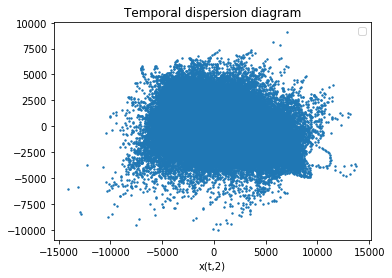

In [7]:
plt.scatter(data[:,0], data[:,1], s=2)
plt.title('Temporal dispersion diagram')
plt.xlabel('x(t,1)')
plt.xlabel('x(t,2)')
plt.axis('scaled')
plt.legend()

> **Q 2:** So far,  we can't visualize the different directions of the sources.

**Q 3: Time-frequency representations of the MDCT of the two stereophonic channels**

In [8]:
M = mdct.mdct(data,window=signal.hann)
M.shape

(512, 433, 2)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


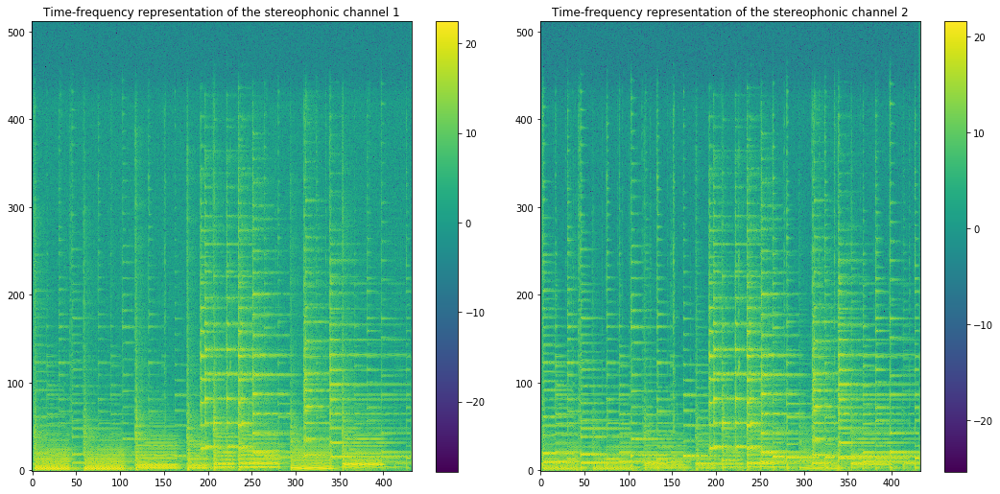

In [9]:
plt.figure(figsize=(15, 7))

plt.subplot(121)
plt.imshow(np.log(M[:,:,0] ** 2)+1e-8)
plt.gca().invert_yaxis()
plt.title("Time-frequency representation of the stereophonic channel 1")
plt.colorbar()

plt.subplot(122)
plt.imshow(np.log(M[:,:,1] ** 2)+1e-8)
plt.gca().invert_yaxis()
plt.title("Time-frequency representation of the stereophonic channel 2")
plt.colorbar()

plt.tight_layout()
plt.show()

**Q 4: Time-frequency dispersion diagram**

Text(0.5, 1.0, 'Time-frequency dispersion diagram')

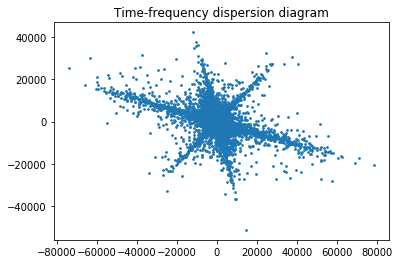

In [10]:
M = mdct.mdct(data, window=signal.hann)
plt.scatter(M[:, :, 0], M[:, :, 1], s=3)
plt.title("Time-frequency dispersion diagram")

> Now, we can distinguish 3 directions.

> We have $Z(f,n)=S(f,n,k)e^{i\theta(k)}$ with $k$ the active function at the $(f,n)$. The angle $\theta(k)$ allows us to identify  the direction of the active source $k$.

**Q 5: The histogram of the arguments**

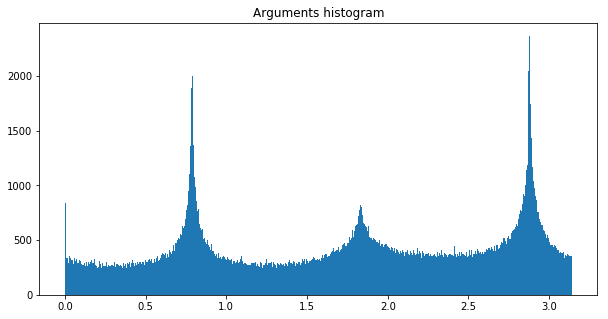

In [11]:
arguments = np.mod(np.arctan2(M[:, :, 0].ravel(), M[:, :, 1].ravel()), np.pi)

plt.figure(figsize=(10, 5))
a, b, _ = plt.hist(arguments, bins=512)
plt.title("Arguments histogram")
plt.show()


> Graphically, the angles $\theta(k)$ are : {0.75, 1.8, 2.85}

**Q 6: Source estimation at each bin by looking fot the source k whose angle is closest to the argument of Z** 

In [12]:
thetas = np.array([0.75, 1.8, 2.9])
source_estim = np.abs(np.sin(thetas.reshape(-1, 1) - arguments)).argmin(0).reshape(512, -1)

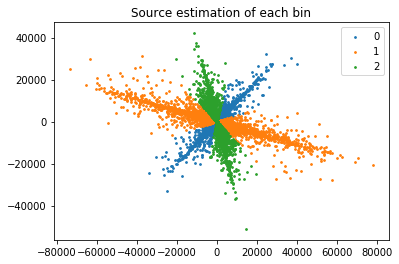

In [13]:
x0, y0 = np.where(source_estim == 0)
plt.scatter(M[x0, y0, 0], M[x0, y0, 1], s=3, label=0)
x1, y1 = np.where(source_estim == 1)
plt.scatter(M[x1, y1, 0], M[x1, y1, 1], s=3, label=1)
x2, y2 = np.where(source_estim == 2)
plt.scatter(M[x2, y2, 0], M[x2, y2, 1], s=3, label=2)

plt.title("Source estimation of each bin")
plt.legend()


In [14]:
# Mask B
B = np.zeros((512,433,3))
for f in range(512):
    for n in range(433):
        val1 = np.abs(np.sin(thetas[0] - np.arctan2(M[f, n, 0].ravel(), M[f, n, 1].ravel())))
        val2 = np.abs(np.sin(thetas[1] - np.arctan2(M[f, n, 0].ravel(), M[f, n, 1].ravel())))
        val3 = np.abs(np.sin(thetas[2] - np.arctan2(M[f, n, 0].ravel(), M[f, n, 1].ravel())))
        
        val  = min([val1,val2,val3])
        i = [val1,val2,val3].index(val)
        B[f,n,i] = 1

**Q 7: Reconstruction of the source signals using inverse MDCT**

/usr/local/lib/python3.7/site-packages/stft/utils.py:53: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]
/usr/local/lib/python3.7/site-packages/stft/utils.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return data[slicetuple]


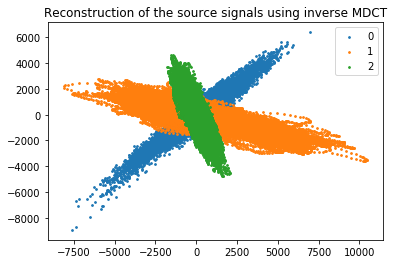

In [15]:
rec_sources = y = np.zeros((512,432,2,3))

for i in range(3):
    Y = np.zeros((512,433,2))
    Y[source_estim == i] = M[source_estim == i]
    y1 = mdct.imdct(Y)
    y[:,:,:,i] = y1.reshape(512, -1, 2)
    rec_sources[:,:,:,i] = y[:,:,:,i]
    plt.scatter(y[:,:,0,i], y[:,:,1,i], s=3, label=i)

plt.title("Reconstruction of the source signals using inverse MDCT")
plt.legend()

**Q 8: Listening to the 3 reconstructed stereophonic images**

In [16]:
# Piano
from IPython import display as idp
audio = rec_sources[:,:,:,0].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [17]:
# Contrebass
audio = rec_sources[:,:,:,1].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [18]:
#Guitar
audio = rec_sources[:,:,:,2].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

> After listening to the 3 reconstructed stereophonic images, we can clearly notice that the source 0 corresponds to the **Piano** , the source 1 to the **Contrebass** and the source 3 to the **Guitar**.
We can here in the three audios some noise left by the other instruments.

**Q 9: MMSE estimation**

In [19]:
Y1 = rec_sources
S = np.zeros((512,432,2,3))
for i in range(3):
    S[:,:,0,i] = (Y1[:,:,0,i])*np.cos(thetas[i])
    S[:,:,1,i] = (Y1[:,:,1,i] )*np.sin(thetas[i])

In [20]:
# Piano
audio = S[:,:,:,0].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [21]:
# Contrebass
audio = S[:,:,:,1].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [22]:
# Guitar
audio = S[:,:,:,2].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [23]:
# All the instruments
audio = (S[:,:,:,0]+S[:,:,:,1]+ S[:,:,:,2]).reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

> We here now all the instruments in the center.

**Q 10: Source directions permutations** 

In [24]:
S_perm = np.zeros((512,432,2,3))

S_perm[:,:,0,0] = (Y1[:,:,0,0])*np.cos(thetas[2])
S_perm[:,:,1,0] = (Y1[:,:,1,0])*np.sin(thetas[2])

S_perm[:,:,0,1] = (Y1[:,:,0,1])*np.cos(thetas[1])
S_perm[:,:,1,1] = (Y1[:,:,1,1])*np.sin(thetas[1])

S_perm[:,:,0,2] = (Y1[:,:,0,2])*np.cos(thetas[0])
S_perm[:,:,1,2] = (Y1[:,:,1,2])*np.sin(thetas[0])

In [25]:
# Piano
audio = S_perm[:,:,:,0].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [26]:
# Contrebass
audio = S_perm[:,:,:,1].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [27]:
# Guitar
audio = S_perm[:,:,:,2].reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

In [28]:
# All the instruments
audio = (S_perm[:,:,:,0]+S_perm[:,:,:,1]+ S_perm[:,:,:,2]).reshape(-1, 2)
idp.Audio([audio[:, 0], audio[:, 1]], rate=rate)

> After the permutation of the directions of the sources, we can hear the piano in the left, the contrebass in the center, and the Guitar on the right. 